In [278]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/jeju-dataset/sample_submission.csv
/kaggle/input/jeju-dataset/train.csv
/kaggle/input/jeju-dataset/test.csv
/kaggle/input/jeju-dataset/international_trade.csv


In [279]:
import pandas as pd
import numpy as np
from tqdm.auto import tqdm

DATA_PATH = '/kaggle/input/jeju-dataset/'

SEED = 42

train = pd.read_csv(f'{DATA_PATH}train.csv')
test = pd.read_csv(f'{DATA_PATH}test.csv')
submission = pd.read_csv(f'{DATA_PATH}sample_submission.csv')
trade = pd.read_csv(f'{DATA_PATH}international_trade.csv')


In [280]:
train['name'] = train['ID'].apply(lambda x: x[:6])
test['name'] = test['ID'].apply(lambda x: x[:6])

train.rename(columns={'supply(kg)': 'supply_kg'}, inplace=True)
train.rename(columns={'price(원/kg)': 'price'}, inplace=True)

## Data Preprocessing

In [281]:
train['timestamp'] = pd.to_datetime(train['timestamp'])

In [282]:
len(train.timestamp.unique()), len(test.timestamp.unique())
# 1) 기존 
### train : 1523개  test : 28개 데이터 
    
# 2) 4일치 제거 
### train = 217*7 (총 217주치, 1519개 데이터)
### test = 4*7 (총 4주치, 3월의 4주치를 예측 필요) 

# 3) 4일치 + 1주일치 제거 (일)

pd.to_datetime('2023-03-04').dayofweek # 토요일 / 토요일~금요일까지 주기대로 예측 
pd.to_datetime('2019-01-01').dayofweek # 화요일 / 처음 화, 수, 목, 금  제외하기? 

1

In [283]:
start_date = pd.Timestamp('2019-01-01')
end_date = pd.Timestamp('2019-01-04')

mask = train.timestamp.apply(lambda x : start_date <= x <= end_date)
train = train[~mask].reset_index().drop(columns='index')

train.shape, test.shape

((59241, 8), (1092, 6))

# Feature

In [284]:
train.head(5)

,ID,timestamp,item,corporation,location,supply_kg,price,name
0,TG_A_J_20190105,2019-01-05,TG,A,J,32352.0,1250.0,TG_A_J
1,TG_A_J_20190106,2019-01-06,TG,A,J,0.0,0.0,TG_A_J
2,TG_A_J_20190107,2019-01-07,TG,A,J,44995.0,1474.0,TG_A_J
3,TG_A_J_20190108,2019-01-08,TG,A,J,26975.0,1326.0,TG_A_J
4,TG_A_J_20190109,2019-01-09,TG,A,J,29265.0,1428.0,TG_A_J


In [285]:

# 연, 월, 일, 요일, 연중 일, 연중 주간 추출 및 칼럼 추가
train['year'] = train['timestamp'].dt.year
train['month'] = train['timestamp'].dt.month
train['day'] = train['timestamp'].dt.day # -> 별 의미없음

# 요일
train['day_of_week'] = train['timestamp'].dt.dayofweek  # 월요일(0)부터 일요일(6)까지
train['is_sunday'] = train['day_of_week'].apply(lambda x: 1 if x == 6 else 0) # 일요일에 떨어짐

# 연 
train['week_of_year'] = train['timestamp'].dt.isocalendar().week  # 연중 주간 (ISO 주차 기준)
train['day_of_year'] = train['timestamp'].dt.dayofyear

# 28일치 예측 필요 : 주당 주기 (요일별 주기) + 보름별 주기 
# 월별 최대 price, 
# 주기 : 1년 (월별로는 주기가 없다고 보면됨)

## time

In [286]:
test['timestamp'] = pd.to_datetime(test['timestamp'])

# 연, 월, 일, 요일, 연중 일, 연중 주간 추출 및 칼럼 추가
test['year'] = test['timestamp'].dt.year
test['month'] = test['timestamp'].dt.month
test['day'] = test['timestamp'].dt.day # -> 별 의미없음

# 요일
test['day_of_week'] = test['timestamp'].dt.dayofweek  # 월요일(0)부터 일요일(6)까지
test['is_sunday'] = test['day_of_week'].apply(lambda x: 1 if x == 6 else 0) # 일요일에 떨어짐

# 연 
test['week_of_year'] = test['timestamp'].dt.isocalendar().week  # 연중 주간 (ISO 주차 기준)
test['day_of_year'] = test['timestamp'].dt.dayofyear

In [287]:
import math

def total_cos(date):
    start_date = pd.to_datetime("2019-01-01 00:00:00")
    end_date = pd.to_datetime("2023-03-31 00:00:00")

    period = (end_date - start_date).total_seconds()

    return math.cos(2 * math.pi * (date - start_date).total_seconds() / period)


def total_sin(date):
    start_date = pd.to_datetime("2019-01-01 00:00:00")
    end_date = pd.to_datetime("2023-03-31 00:00:00")

    period = (end_date - start_date).total_seconds()

    return math.sin(2 * math.pi * (date - start_date).total_seconds() / period)


train['total_cos'] = train['timestamp'].apply(total_cos)
train['total_sin'] = train['timestamp'].apply(total_sin)


test['total_cos'] = test['timestamp'].apply(total_cos)
test['total_sin'] = test['timestamp'].apply(total_sin)

In [288]:

def year_cos(date):
    day_of_year = date.timetuple().tm_yday  # 해당 날짜의 연중 몇 번째 날인지를 가져옵니다.
    period = 365  # 1년은 365일
    return math.cos(2 * math.pi * day_of_year / period)

def year_sin(date):
    day_of_year = date.timetuple().tm_yday  # 해당 날짜의 연중 몇 번째 날인지를 가져옵니다.
    period = 365  # 1년은 365일
    return math.sin(2 * math.pi * day_of_year / period)

train['year_cos'] = train['timestamp'].apply(year_cos)
train['year_sin'] = train['timestamp'].apply(year_sin)

test['year_cos'] = test['timestamp'].apply(year_cos)
test['year_sin'] = test['timestamp'].apply(year_sin)


In [289]:
test['total_sin'] = test['total_sin'].apply(lambda x : '{:.6f}'.format(x))
test 

,ID,timestamp,item,corporation,location,name,year,month,day,day_of_week,is_sunday,week_of_year,day_of_year,total_cos,total_sin,year_cos,year_sin
0,TG_A_J_20230304,2023-03-04,TG,A,J,TG_A_J,2023,3,4,5,0,9,63,0.994016,-0.109231,0.467359,0.884068
1,TG_A_J_20230305,2023-03-05,TG,A,J,TG_A_J,2023,3,5,6,1,9,64,0.994451,-0.105200,0.452072,0.891981
2,TG_A_J_20230306,2023-03-06,TG,A,J,TG_A_J,2023,3,6,0,0,10,65,0.994869,-0.101168,0.436651,0.899631
3,TG_A_J_20230307,2023-03-07,TG,A,J,TG_A_J,2023,3,7,1,0,10,66,0.995271,-0.097135,0.421101,0.907014
4,TG_A_J_20230308,2023-03-08,TG,A,J,TG_A_J,2023,3,8,2,0,10,67,0.995657,-0.093099,0.405426,0.914128
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1087,RD_F_J_20230327,2023-03-27,RD,F,J,RD_F_J,2023,3,27,0,0,13,86,0.999869,-0.016214,0.090252,0.995919
1088,RD_F_J_20230328,2023-03-28,RD,F,J,RD_F_J,2023,3,28,1,0,13,87,0.999926,-0.012161,0.073095,0.997325
1089,RD_F_J_20230329,2023-03-29,RD,F,J,RD_F_J,2023,3,29,2,0,13,88,0.999967,-0.008107,0.055917,0.998435
1090,RD_F_J_20230330,2023-03-30,RD,F,J,RD_F_J,2023,3,30,3,0,13,89,0.999992,-0.004054,0.038722,0.999250


## price, supply

In [290]:
# 7일치 이동평균, 앞선 7일치를 지워버리기 

# 이동평균으로 price, supply 구하기 

In [291]:

window_size = 7
# moving average
train['price_ma'] = train['price'].rolling(window=window_size).mean()
train['supply_ma'] = train['supply_kg'].rolling(window=window_size).mean()

# weighted moving average 
# alpha = 0.2  # 지수가중이동평균의 smoothing factor (0 < alpha <= 1)
# train['price_ema_0.2'] = train['price'].ewm(alpha=alpha, adjust=False).mean()
# train['supply_ema_0.2'] = train['supply_kg'].ewm(alpha=alpha, adjust=False).mean()

# train['price_ema_0.5'] = train['price'].ewm(alpha=alpha, adjust=False).mean()
# train['supply_ema_0.5'] = train['supply_kg'].ewm(alpha=alpha, adjust=False).mean()

train.head(20)

start_date = pd.Timestamp('2019-01-05')
end_date = pd.Timestamp('2019-01-11')

mask = train.timestamp.apply(lambda x : start_date <= x <= end_date)
train = train[~mask].reset_index().drop(columns='index')

train.shape, test.shape

((58968, 21), (1092, 17))

In [292]:
# 요일별 
name_day_of_week_avg_price = train.groupby(['name', 'day_of_week'])['price'].mean().reset_index()
name_day_of_week_avg_price.shape #273 데이터

train = train.merge(name_day_of_week_avg_price, on=['name', 'day_of_week'], how='left', suffixes=('','_day_of_week_avg_price'))
test = test.merge(name_day_of_week_avg_price, on=['name', 'day_of_week'], how='left', suffixes=('','_day_of_week_avg_price'))

# 연일별 평균
name_day_of_year_avg_price = train.groupby(['name', 'day_of_year'])['price'].mean().reset_index()
name_day_of_year_avg_price.shape #14274 데이터

train = train.merge(name_day_of_year_avg_price, on=['name', 'day_of_year'], how='left', suffixes=('','_day_of_year_avg_price'))
test = test.merge(name_day_of_year_avg_price, on=['name', 'day_of_year'], how='left', suffixes=('','_day_of_year_avg_price'))

# 연일별 이동평균의 평균
ma_name_day_of_year_avg_price = train.groupby(['name', 'day_of_year'])['price_ma'].mean().reset_index()
ma_name_day_of_year_avg_price.shape #14274 데이터

train = train.merge(ma_name_day_of_year_avg_price, on=['name', 'day_of_year'], how='left', suffixes=('','_day_of_year_avg_price'))
test = test.merge(ma_name_day_of_year_avg_price, on=['name', 'day_of_year'], how='left', suffixes=('','_day_of_year_avg_price'))

# 연일별 minimum 
name_day_of_year_max_price = train.groupby(['name', 'day_of_year'])['price'].max().reset_index()
name_day_of_year_max_price.shape #14274 데이터

train = train.merge(name_day_of_year_max_price, on=['name', 'day_of_year'], how='left', suffixes=('','_day_of_year_max_price'))
test = test.merge(name_day_of_year_max_price, on=['name', 'day_of_year'], how='left', suffixes=('','_day_of_year_max_price'))

# 연일별 minimum
name_day_of_year_min_price = train.groupby(['name', 'day_of_year'])['price'].min().reset_index()
name_day_of_year_min_price.shape #14274 데이터

train = train.merge(name_day_of_year_min_price, on=['name', 'day_of_year'], how='left', suffixes=('','_day_of_year_min_price'))
test = test.merge(name_day_of_year_min_price, on=['name', 'day_of_year'], how='left', suffixes=('','_day_of_year_min_price'))


In [293]:
train['price_max_min'] = train['price_day_of_year_max_price'] - train['price_day_of_year_min_price'] 
test['price_max_min'] = test['price_day_of_year_max_price'] - test['price_day_of_year_min_price'] 

In [294]:
# 요일별 
name_day_of_week_avg_supply = train.groupby(['name', 'day_of_week'])['supply_kg'].mean().reset_index()
name_day_of_week_avg_supply.shape #273 데이터

train = train.merge(name_day_of_week_avg_supply, on=['name', 'day_of_week'], how='left', suffixes=('','_day_of_week_avg_supply'))
test = test.merge(name_day_of_week_avg_supply, on=['name', 'day_of_week'], how='left', suffixes=('','_day_of_week_avg_supply'))

# 연일별 평균
name_day_of_year_avg_supply = train.groupby(['name', 'day_of_year'])['supply_kg'].mean().reset_index()
name_day_of_year_avg_supply.shape #14274 데이터

train = train.merge(name_day_of_year_avg_supply, on=['name', 'day_of_year'], how='left', suffixes=('','_day_of_year_avg_supply'))
test = test.merge(name_day_of_year_avg_supply, on=['name', 'day_of_year'], how='left', suffixes=('','_day_of_year_avg_supply'))

# 연일별 이동평균의 평균
ma_name_day_of_year_avg_supply = train.groupby(['name', 'day_of_year'])['supply_ma'].mean().reset_index()
ma_name_day_of_year_avg_supply.shape #14274 데이터

train = train.merge(ma_name_day_of_year_avg_supply, on=['name', 'day_of_year'], how='left', suffixes=('','_day_of_year_avg_supply'))
test = test.merge(ma_name_day_of_year_avg_supply, on=['name', 'day_of_year'], how='left', suffixes=('','_day_of_year_avg_supply'))


/tmp/ipykernel_32/2277377705.py:5: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(20,3))


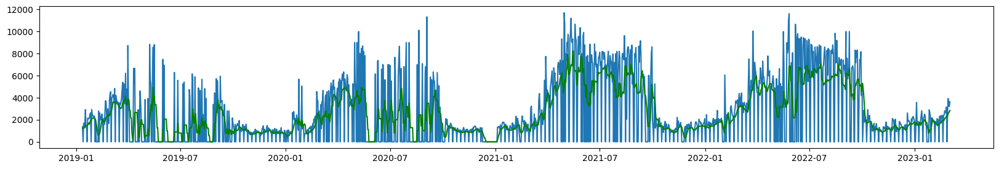

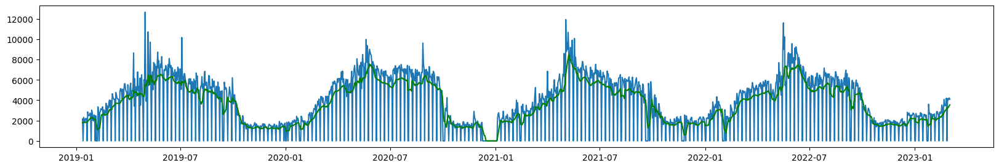

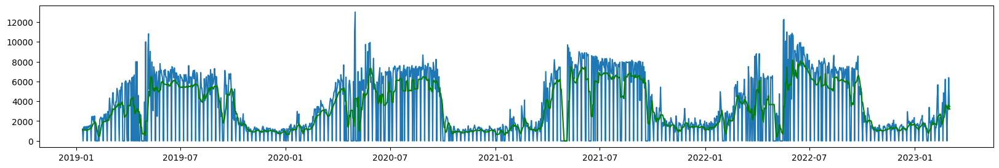

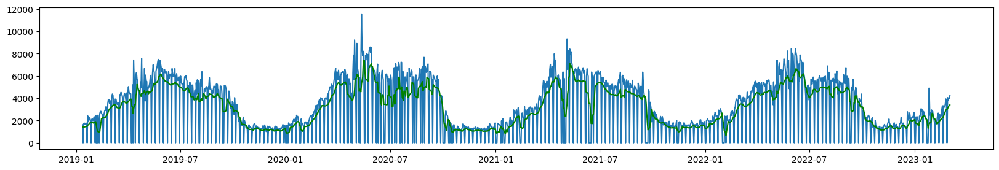

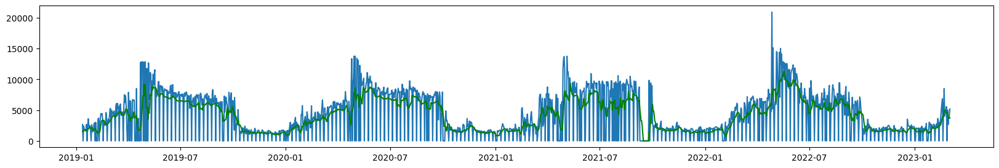

...

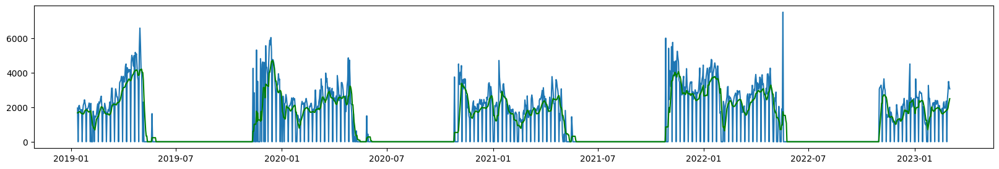

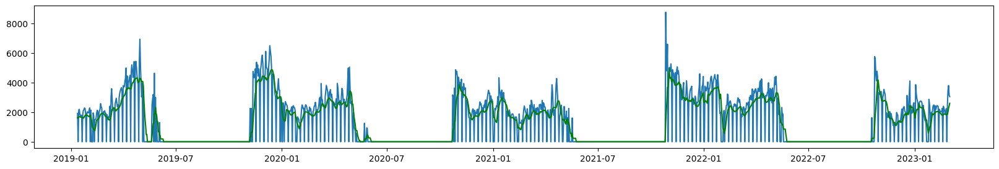

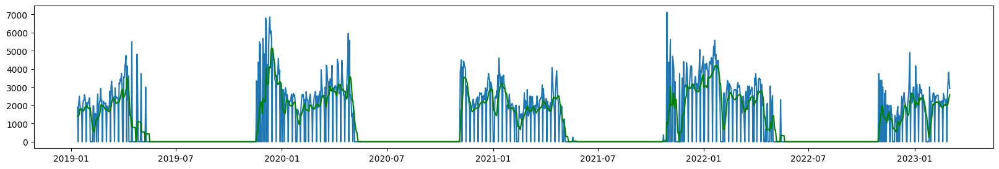

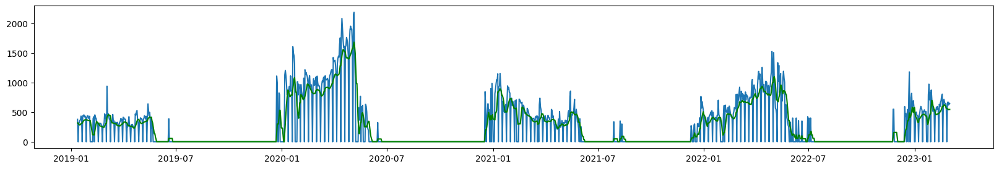

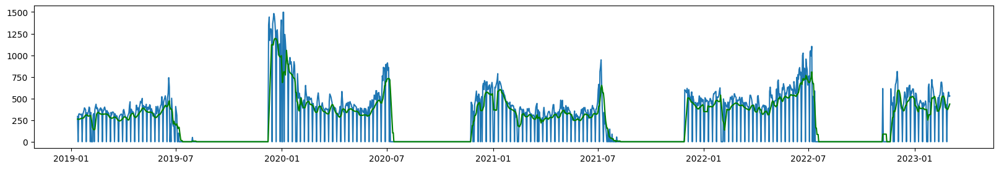

In [295]:
import matplotlib.pyplot as plt

for name in train.name.unique():
    
    plt.figure(figsize=(20,3))
    plt.plot(train.timestamp[train.name==name],train.price[train.name==name])
    plt.plot(train.timestamp[train.name==name],train.price_ma[train.name==name], color = 'g')
#     plt.plot(train.timestamp[train.name==name],train['price_ema_0.5'][train.name==name] , color= 'y')
#     plt.plot(train.timestamp[train.name==name],train['price_ema_0.2'][train.name==name] , color= 'r')

/tmp/ipykernel_32/4250246754.py:5: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(20,3))


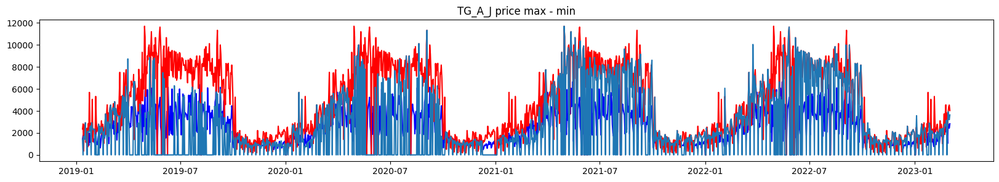

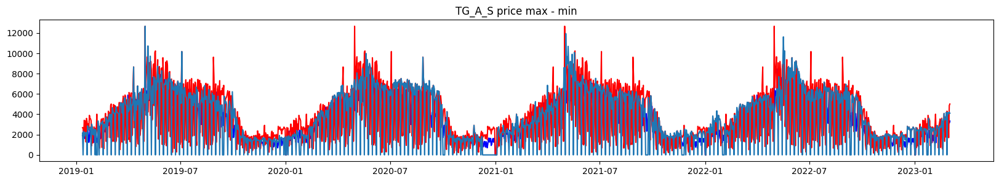

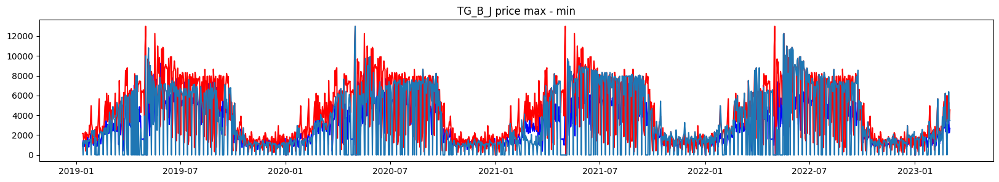

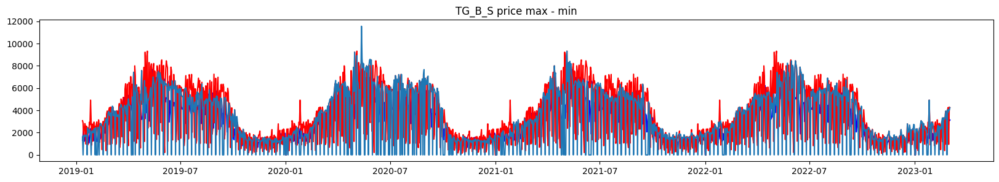

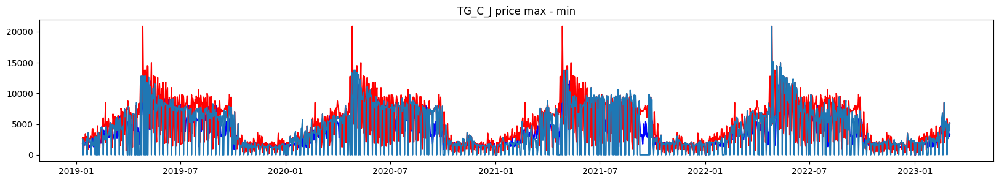

...

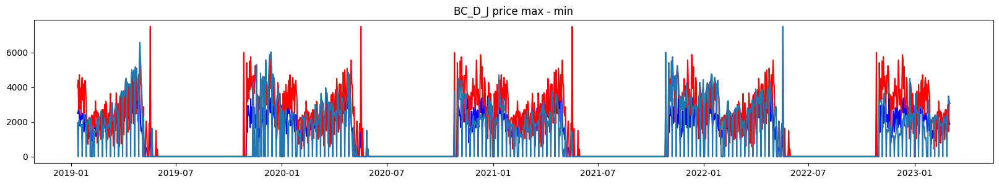

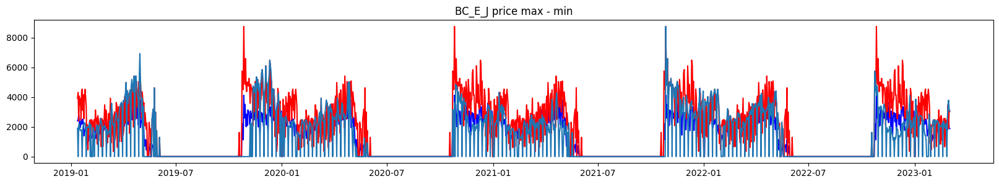

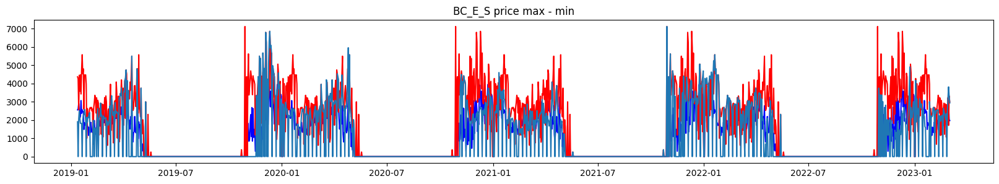

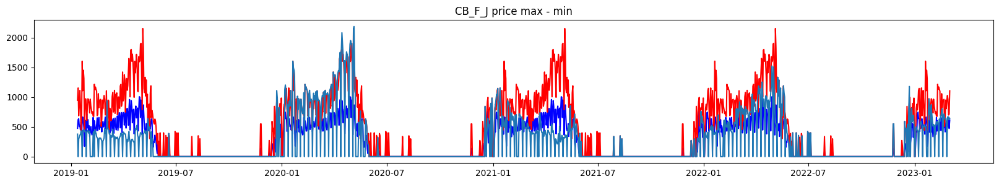

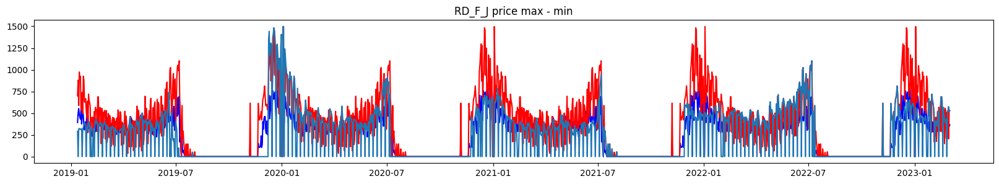

In [296]:
import matplotlib.pyplot as plt

for name in train.name.unique():
    
    plt.figure(figsize=(20,3))
    plt.title (f'{name} price max - min')
#     plt.plot(train.timestamp[train.name==name],train.price_day_of_year_min_price[train.name==name], color = 'g')
    plt.plot(train.timestamp[train.name==name],train.price_day_of_year_avg_price[train.name==name], color = 'b')
#     plt.plot(train.timestamp[train.name==name],train.price_day_of_year_max_price[train.name==name], color = 'y')
    plt.plot(train.timestamp[train.name==name],train.price_max_min[train.name==name], color = 'r')
    plt.plot(train.timestamp[train.name==name],train.price[train.name==name])
    
    
# CR AJ / RD AJ  : CR AJ  --> 2022년 5-6월부터 급증 --> 최근 지수 반영한 것이라 오히려 괜찮은걸로?

In [297]:
train

,ID,timestamp,item,corporation,location,supply_kg,price,name,year,month,...,supply_ma,price_day_of_week_avg_price,price_day_of_year_avg_price,price_ma_day_of_year_avg_price,price_day_of_year_max_price,price_day_of_year_min_price,price_max_min,supply_kg_day_of_week_avg_supply,supply_kg_day_of_year_avg_supply,supply_ma_day_of_year_avg_supply
0,TG_A_J_20190112,2019-01-12,TG,A,J,35488.0,1374.0,TG_A_J,2019,1,...,26243.000000,2584.333333,1386.0,1243.657143,2350.0,0.0,2350.0,9787.628704,39076.62,31810.800000
1,TG_A_J_20190113,2019-01-13,TG,A,J,0.0,0.0,TG_A_J,2019,1,...,26243.000000,7.393519,1765.4,1333.314286,2819.0,0.0,2819.0,201.180556,31052.96,31089.802857
2,TG_A_J_20190114,2019-01-14,TG,A,J,15320.0,1694.0,TG_A_J,2019,1,...,22003.714286,3123.643519,1861.4,1388.342857,2044.0,1694.0,350.0,11413.275000,43289.40,31116.545714
3,TG_A_J_20190115,2019-01-15,TG,A,J,40486.0,1456.0,TG_A_J,2019,1,...,23933.857143,3005.731481,1619.8,1476.485714,2740.0,0.0,2740.0,11021.154630,41132.20,33255.288571
4,TG_A_J_20190116,2019-01-16,TG,A,J,37623.0,1470.0,TG_A_J,2019,1,...,25127.857143,3001.532407,1434.6,1523.885714,2125.0,0.0,2125.0,9214.315741,33048.74,34092.080000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
58963,RD_F_J_20230227,2023-02-27,RD,F,J,452440.0,468.0,RD_F_J,2023,2,...,394820.000000,310.407407,311.0,356.914286,468.0,0.0,468.0,239907.870370,327560.00,390652.571429
58964,RD_F_J_20230228,2023-02-28,RD,F,J,421980.0,531.0,RD_F_J,2023,2,...,368885.714286,318.837963,360.4,355.342857,531.0,0.0,531.0,226467.962963,330140.00,385520.571429
58965,RD_F_J_20230301,2023-03-01,RD,F,J,382980.0,574.0,RD_F_J,2023,3,...,350397.142857,307.629630,441.2,357.571429,574.0,370.0,204.0,220361.018519,362056.00,372618.285714
58966,RD_F_J_20230302,2023-03-02,RD,F,J,477220.0,523.0,RD_F_J,2023,3,...,350234.285714,296.750000,347.6,359.142857,523.0,0.0,523.0,219843.518519,361960.00,373516.000000


/tmp/ipykernel_32/2042159294.py:5: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(20,3))


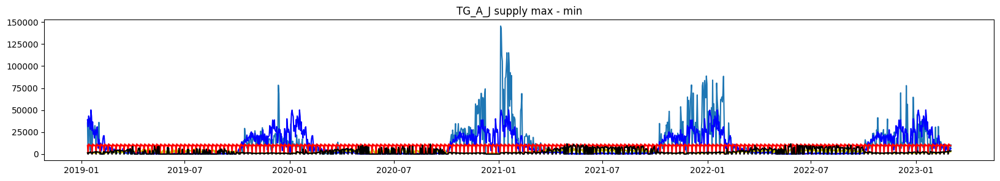

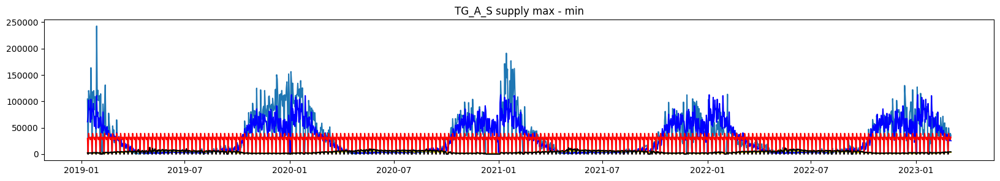

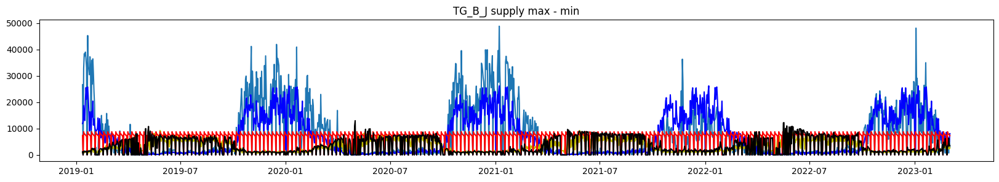

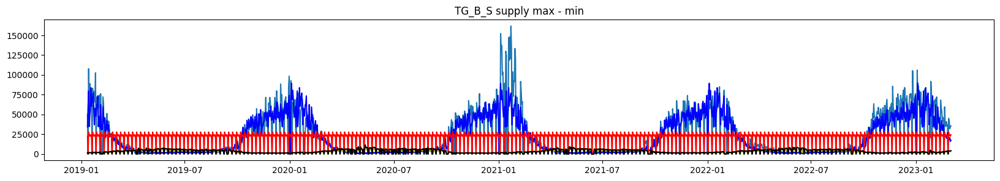

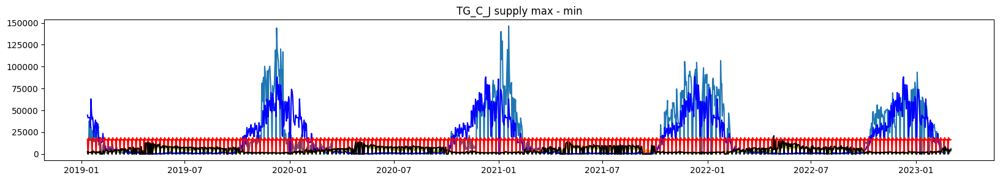

...

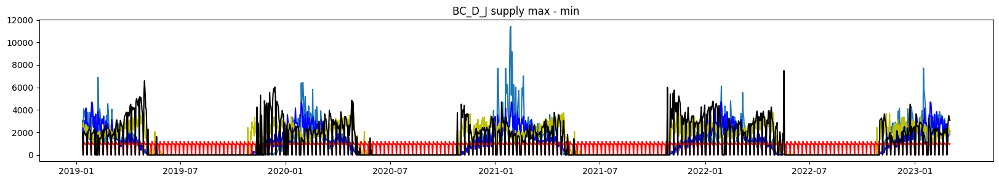

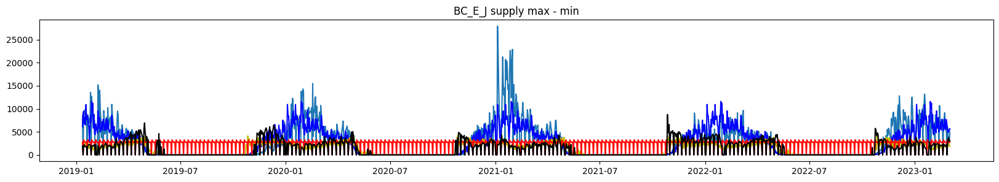

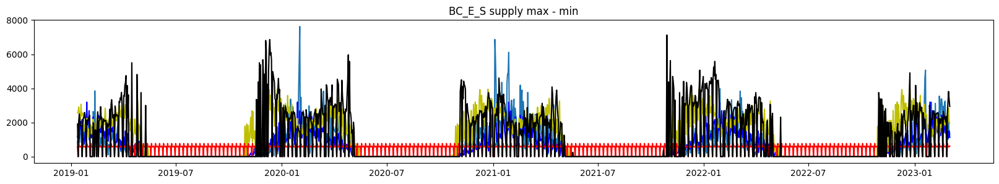

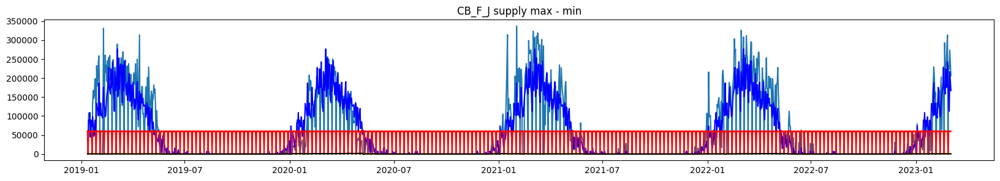

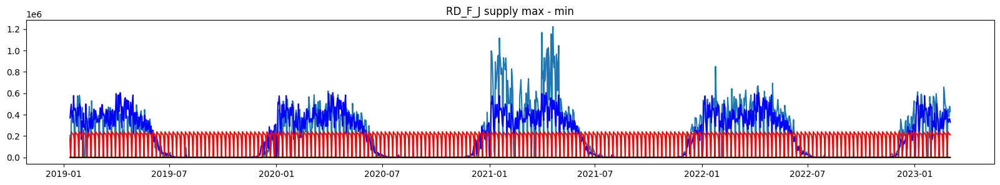

In [298]:
import matplotlib.pyplot as plt

for name in train.name.unique():
    
    plt.figure(figsize=(20,3))
    plt.title (f'{name} supply max - min')
    
#     plt.plot(train.timestamp[train.name==name],train.price_day_of_year_min_price[train.name==name], color = 'g')
    plt.plot(train.timestamp[train.name==name],train.supply_kg[train.name==name])
    plt.plot(train.timestamp[train.name==name],train.supply_kg_day_of_year_avg_supply[train.name==name], color = 'b')
    plt.plot(train.timestamp[train.name==name],train.price_day_of_year_avg_price[train.name==name], color = 'y')
    plt.plot(train.timestamp[train.name==name],train.supply_kg_day_of_week_avg_supply[train.name==name], color = 'r')
    plt.plot(train.timestamp[train.name==name],train.price[train.name==name],color='k') # 흰색

    
    
# CR AJ / RD AJ  : CR AJ  --> 2022년 5-6월부터 급증 --> 최근 지수 반영한 것이라 오히려 괜찮은걸로?

In [299]:
# # supply를 price의 min, max값 기준으로 스케일링하기 

# from sklearn.preprocessing import MinMaxScaler

# for name in train.name.unique():
#     filtered_train = train[train.name == name]
#     min_price = filtered_train['price'].min()
#     max_price = filtered_train['price'].max()

#     scaler = MinMaxScaler(feature_range=(min_price, max_price))

#     # 'price' 칼럼의 최대값을 1000으로 스케일링하고, 'supply' 칼럼도 동일한 최대값으로 스케일링
#     filtered_train['price_scaled_supply_kg'] = scaler.fit_transform(filtered_train[['supply_kg']])


In [300]:
train

,ID,timestamp,item,corporation,location,supply_kg,price,name,year,month,...,supply_ma,price_day_of_week_avg_price,price_day_of_year_avg_price,price_ma_day_of_year_avg_price,price_day_of_year_max_price,price_day_of_year_min_price,price_max_min,supply_kg_day_of_week_avg_supply,supply_kg_day_of_year_avg_supply,supply_ma_day_of_year_avg_supply
0,TG_A_J_20190112,2019-01-12,TG,A,J,35488.0,1374.0,TG_A_J,2019,1,...,26243.000000,2584.333333,1386.0,1243.657143,2350.0,0.0,2350.0,9787.628704,39076.62,31810.800000
1,TG_A_J_20190113,2019-01-13,TG,A,J,0.0,0.0,TG_A_J,2019,1,...,26243.000000,7.393519,1765.4,1333.314286,2819.0,0.0,2819.0,201.180556,31052.96,31089.802857
2,TG_A_J_20190114,2019-01-14,TG,A,J,15320.0,1694.0,TG_A_J,2019,1,...,22003.714286,3123.643519,1861.4,1388.342857,2044.0,1694.0,350.0,11413.275000,43289.40,31116.545714
3,TG_A_J_20190115,2019-01-15,TG,A,J,40486.0,1456.0,TG_A_J,2019,1,...,23933.857143,3005.731481,1619.8,1476.485714,2740.0,0.0,2740.0,11021.154630,41132.20,33255.288571
4,TG_A_J_20190116,2019-01-16,TG,A,J,37623.0,1470.0,TG_A_J,2019,1,...,25127.857143,3001.532407,1434.6,1523.885714,2125.0,0.0,2125.0,9214.315741,33048.74,34092.080000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
58963,RD_F_J_20230227,2023-02-27,RD,F,J,452440.0,468.0,RD_F_J,2023,2,...,394820.000000,310.407407,311.0,356.914286,468.0,0.0,468.0,239907.870370,327560.00,390652.571429
58964,RD_F_J_20230228,2023-02-28,RD,F,J,421980.0,531.0,RD_F_J,2023,2,...,368885.714286,318.837963,360.4,355.342857,531.0,0.0,531.0,226467.962963,330140.00,385520.571429
58965,RD_F_J_20230301,2023-03-01,RD,F,J,382980.0,574.0,RD_F_J,2023,3,...,350397.142857,307.629630,441.2,357.571429,574.0,370.0,204.0,220361.018519,362056.00,372618.285714
58966,RD_F_J_20230302,2023-03-02,RD,F,J,477220.0,523.0,RD_F_J,2023,3,...,350234.285714,296.750000,347.6,359.142857,523.0,0.0,523.0,219843.518519,361960.00,373516.000000


AttributeError: 'DataFrame' object has no attribute 'price_scaled_supply_kg'

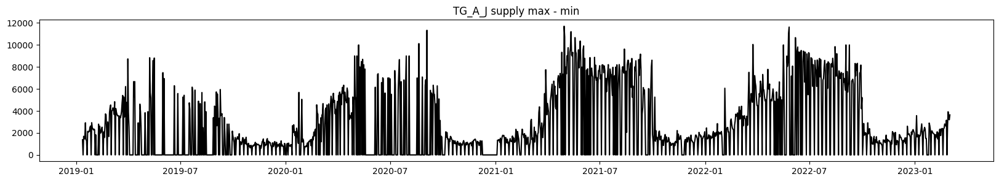

In [301]:
# import matplotlib.pyplot as plt

# for name in train.name.unique():
    
#     plt.figure(figsize=(20,3))
#     plt.title (f'{name} supply max - min')
    
# #     plt.plot(train.timestamp[train.name==name],train.price_day_of_year_min_price[train.name==name], color = 'g')
# #     plt.plot(train.timestamp[train.name==name],train.supply_kg_day_of_year_avg_supply[train.name==name], color = 'b')
# #     plt.plot(train.timestamp[train.name==name],train.price_day_of_year_avg_price[train.name==name], color = 'y')
# #     plt.plot(train.timestamp[train.name==name],train.supply_kg_day_of_week_avg_supply[train.name==name], color = 'r')
#     plt.plot(train.timestamp[train.name==name],train.price[train.name==name],color='k') # 흰색
#     plt.plot(train.timestamp[train.name==name],train.price_scaled_supply_kg[train.name==name],color = 'r')



In [302]:
# price - supply 간 상관계수 확인하기 
# 피어슨 상관계수 + 스피어만 상관계수 

for name in train.name.unique():
    filtered_train = train[train.name == name]
    filtered_train['pearson_corr'] = filtered_train['price'].corr(filtered_train['supply_kg'], method='pearson')
    filtered_train['spearman_corr'] = filtered_train['price'].corr(filtered_train['supply_kg'], method='spearman')
    print (f'{name} train-pearson',filtered_train.pearson_corr.unique())
    print (f'{name} train-spearman',filtered_train.spearman_corr.unique())

for name in test.name.unique():
    filtered_test = test[test.name == name]
    filtered_test['pearson_corr'] = filtered_test['price'].corr(filtered_test['supply_kg'], method='pearson')
    filtered_test['spearman_corr'] = filtered_test['price'].corr(filtered_test['supply_kg'], method='spearman')
    print (f'{name} test-pearson',filtered_test.pearson_corr.unique())
    print (f'{name} test-spearman',filtered_test.spearman_corr.unique())


/tmp/ipykernel_32/949986289.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_train['pearson_corr'] = filtered_train['price'].corr(filtered_train['supply_kg'], method='pearson')
/tmp/ipykernel_32/949986289.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_train['spearman_corr'] = filtered_train['price'].corr(filtered_train['supply_kg'], method='spearman')
/tmp/ipykernel_32/949986289.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try us

TG_A_J train-pearson [-0.14479652]
TG_A_J train-spearman [0.45368642]
TG_A_S train-pearson [-0.31118596]
TG_A_S train-spearman [-0.03057558]
TG_B_J train-pearson [-0.32595618]
TG_B_J train-spearman [0.1407602]
TG_B_S train-pearson [-0.3250675]
TG_B_S train-spearman [-0.0096618]
TG_C_J train-pearson [-0.31823489]
TG_C_J train-spearman [0.06020214]
TG_C_S train-pearson [-0.29763315]
TG_C_S train-spearman [-0.01274675]
TG_D_J train-pearson [-0.25381825]
TG_D_J train-spearman [0.27119084]
TG_D_S train-pearson [-0.26101302]
TG_D_S train-spearman [0.05218397]
TG_E_J train-pearson [-0.13832937]
TG_E_J train-spearman [0.48384352]
TG_E_S train-pearson [-0.29965888]
TG_E_S train-spearman [0.01520392]
CR_A_J train-pearson [0.27208955]
CR_A_J train-spearman [0.90737535]
CR_B_J train-pearson [0.57947415]
CR_B_J train-spearman [0.99057682]


/tmp/ipykernel_32/949986289.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_train['pearson_corr'] = filtered_train['price'].corr(filtered_train['supply_kg'], method='pearson')
/tmp/ipykernel_32/949986289.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_train['spearman_corr'] = filtered_train['price'].corr(filtered_train['supply_kg'], method='spearman')
/tmp/ipykernel_32/949986289.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try us

CR_C_J train-pearson [0.73776113]
CR_C_J train-spearman [0.97936305]
CR_D_J train-pearson [0.70141787]
CR_D_J train-spearman [0.9418487]
CR_D_S train-pearson [0.83482156]
CR_D_S train-spearman [0.99999495]
CR_E_J train-pearson [0.69601379]
CR_E_J train-spearman [0.95328992]
CR_E_S train-pearson [0.91375591]
CR_E_S train-spearman [0.9999186]
CB_A_J train-pearson [0.22106057]
CB_A_J train-spearman [0.96532083]
CB_A_S train-pearson [0.9132894]
CB_A_S train-spearman [0.99984911]
CB_D_J train-pearson [0.56175184]
CB_D_J train-spearman [0.98171439]
CB_E_J train-pearson [0.45216233]
CB_E_J train-spearman [0.96096268]
RD_A_J train-pearson [0.05386731]
RD_A_J train-spearman [0.78235605]
RD_A_S train-pearson [0.65476034]
RD_A_S train-spearman [0.93574577]
RD_C_S train-pearson [0.93459807]
RD_C_S train-spearman [0.99991508]


/tmp/ipykernel_32/949986289.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_train['pearson_corr'] = filtered_train['price'].corr(filtered_train['supply_kg'], method='pearson')
/tmp/ipykernel_32/949986289.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_train['spearman_corr'] = filtered_train['price'].corr(filtered_train['supply_kg'], method='spearman')
/tmp/ipykernel_32/949986289.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try us

RD_D_J train-pearson [0.62938124]
RD_D_J train-spearman [0.92354864]
RD_D_S train-pearson [0.63279939]
RD_D_S train-spearman [0.90625391]
RD_E_J train-pearson [0.82902327]
RD_E_J train-spearman [0.9625801]
RD_E_S train-pearson [0.8365348]
RD_E_S train-spearman [0.98834141]
BC_A_J train-pearson [0.55696764]
BC_A_J train-spearman [0.82283914]
BC_A_S train-pearson [0.50452335]
BC_A_S train-spearman [0.87444935]
BC_B_J train-pearson [0.44352013]
BC_B_J train-spearman [0.91421747]
BC_B_S train-pearson [0.67307252]
BC_B_S train-spearman [0.999714]
BC_C_J train-pearson [0.50754116]
BC_C_J train-spearman [0.91879416]
BC_C_S train-pearson [0.80119855]
BC_C_S train-spearman [0.99990414]
BC_D_J train-pearson [0.47534197]
BC_D_J train-spearman [0.84737464]
BC_E_J train-pearson [0.48177897]
BC_E_J train-spearman [0.81784291]
BC_E_S train-pearson [0.56091096]
BC_E_S train-spearman [0.90320118]


/tmp/ipykernel_32/949986289.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_train['pearson_corr'] = filtered_train['price'].corr(filtered_train['supply_kg'], method='pearson')
/tmp/ipykernel_32/949986289.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_train['spearman_corr'] = filtered_train['price'].corr(filtered_train['supply_kg'], method='spearman')
/tmp/ipykernel_32/949986289.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try us

CB_F_J train-pearson [0.59769377]
CB_F_J train-spearman [0.92276254]
RD_F_J train-pearson [0.52261255]
RD_F_J train-spearman [0.79283144]
TG_A_J test-pearson [0.97222978]
TG_A_J test-spearman [0.67857143]
TG_A_S test-pearson [0.95906593]
TG_A_S test-spearman [0.32142857]
TG_B_J test-pearson [0.9763191]
TG_B_J test-spearman [0.10714286]
TG_B_S test-pearson [0.97237096]
TG_B_S test-spearman [0.35714286]
TG_C_J test-pearson [0.98316482]
TG_C_J test-spearman [0.07142857]
TG_C_S test-pearson [0.97591707]
TG_C_S test-spearman [0.60714286]
TG_D_J test-pearson [0.9869089]
TG_D_J test-spearman [0.71428571]
TG_D_S test-pearson [0.95671957]
TG_D_S test-spearman [0.57142857]
TG_E_J test-pearson [0.977807]
TG_E_J test-spearman [0.53571429]
TG_E_S test-pearson [0.98625791]
TG_E_S test-spearman [0.57142857]
CR_A_J test-pearson [0.90253748]
CR_A_J test-spearman [0.53571429]
CR_B_J test-pearson [0.92376642]
CR_B_J test-spearman [0.64285714]
CR_C_J test-pearson [0.98526753]
CR_C_J test-spearman [0.85714

/tmp/ipykernel_32/949986289.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_test['spearman_corr'] = filtered_test['price'].corr(filtered_test['supply_kg'], method='spearman')
/tmp/ipykernel_32/949986289.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_test['pearson_corr'] = filtered_test['price'].corr(filtered_test['supply_kg'], method='pearson')
/tmp/ipykernel_32/949986289.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using

In [ ]:
# 이동평균 - 아예 price, supply를 이동평균 해서 추가하기 

# train['price_wd']

# 7일치 이동평균 

# 로그변환 - price, supply를 로그 변환해서 추가하기 

train['supply_kg']

# 주기성 

# cos, sin? 푸리에 변환? 

In [303]:
train.columns # supply_kg, price, price_ma, supply_ma, 

Index(['ID', 'timestamp', 'item', 'corporation', 'location', 'supply_kg',
       'price', 'name', 'year', 'month', 'day', 'day_of_week', 'is_sunday',
       'week_of_year', 'day_of_year', 'total_cos', 'total_sin', 'year_cos',
       'year_sin', 'price_ma', 'supply_ma', 'price_day_of_week_avg_price',
       'price_day_of_year_avg_price', 'price_ma_day_of_year_avg_price',
       'price_day_of_year_max_price', 'price_day_of_year_min_price',
       'price_max_min', 'supply_kg_day_of_week_avg_supply',
       'supply_kg_day_of_year_avg_supply', 'supply_ma_day_of_year_avg_supply'],
      dtype='object')

In [307]:
# price => price_day_of_week_avg_price
# price_ma => price_ma_day_of_year_avg_price

test = test.rename(columns={'price': 'price_day_of_week_avg_price', 'price_ma': 'price_ma_day_of_year_avg_price',
                           'supply_kg':'supply_kg_day_of_week_avg_supply', 'supply_ma':'supply_ma_day_of_year_avg_supply'})
test.columns



Index(['ID', 'timestamp', 'item', 'corporation', 'location', 'name', 'year',
       'month', 'day', 'day_of_week', 'is_sunday', 'week_of_year',
       'day_of_year', 'total_cos', 'total_sin', 'year_cos', 'year_sin',
       'price_day_of_week_avg_price', 'price_day_of_year_avg_price',
       'price_ma_day_of_year_avg_price', 'price_day_of_year_max_price',
       'price_day_of_year_min_price', 'price_max_min',
       'supply_kg_day_of_week_avg_supply', 'supply_kg_day_of_year_avg_supply',
       'supply_ma_day_of_year_avg_supply'],
      dtype='object')

# 건물 전체

In [308]:
target = train['price']

train_drop_cols = ['ID','timestamp','price','supply_kg', 'price_ma','supply_ma']
train_ft = train.drop(columns = train_drop_cols)

test_drop_cols = ['ID','timestamp']
test_ft = test.drop(columns = test_drop_cols)

target.shape, train.shape, test.shape, train_ft.shape, test_ft.shape

((58968,), (58968, 30), (1092, 26), (58968, 24), (1092, 24))

In [309]:
train_ft.head()

,item,corporation,location,name,year,month,day,day_of_week,is_sunday,week_of_year,...,year_sin,price_day_of_week_avg_price,price_day_of_year_avg_price,price_ma_day_of_year_avg_price,price_day_of_year_max_price,price_day_of_year_min_price,price_max_min,supply_kg_day_of_week_avg_supply,supply_kg_day_of_year_avg_supply,supply_ma_day_of_year_avg_supply
0,TG,A,J,TG_A_J,2019,1,12,5,0,2,...,0.205104,2584.333333,1386.0,1243.657143,2350.0,0.0,2350.0,9787.628704,39076.62,31810.800000
1,TG,A,J,TG_A_J,2019,1,13,6,1,2,...,0.221922,7.393519,1765.4,1333.314286,2819.0,0.0,2819.0,201.180556,31052.96,31089.802857
2,TG,A,J,TG_A_J,2019,1,14,0,0,3,...,0.238673,3123.643519,1861.4,1388.342857,2044.0,1694.0,350.0,11413.275000,43289.40,31116.545714
3,TG,A,J,TG_A_J,2019,1,15,1,0,3,...,0.255353,3005.731481,1619.8,1476.485714,2740.0,0.0,2740.0,11021.154630,41132.20,33255.288571
4,TG,A,J,TG_A_J,2019,1,16,2,0,3,...,0.271958,3001.532407,1434.6,1523.885714,2125.0,0.0,2125.0,9214.315741,33048.74,34092.080000


In [310]:
train_cat_cols = train[['item','corporation','location']]
test_cat_cols = test[['item','corporation','location']]

# from sklearn.preprocessing import LabelEncoder

# # 라벨 인코더 생성
# label_encoder = LabelEncoder()
# train_label_cat = train_cat_cols.apply(lambda x: label_encoder.fit_transform(x))
# train_label_cat.columns = ['label_' + col for col in train_label_cat.columns]

# test_label_cat = test_cat_cols.apply(lambda x: label_encoder.transform(x))
# test_label_cat.columns = ['label_' + col for col in test_label_cat.columns]

from sklearn.preprocessing import LabelEncoder

# 학습 데이터와 테스트 데이터를 합친 후 라벨 인코딩을 수행
all_data = pd.concat([train_cat_cols, test_cat_cols], axis=0)
label_encoder = LabelEncoder()
all_encoded = all_data.apply(lambda x: label_encoder.fit_transform(x))

# 다시 학습 데이터와 테스트 데이터로 분리
train_label_cat = all_encoded[:len(train_cat_cols)]
test_label_cat = all_encoded[len(train_cat_cols):]

# 열 이름 변경
train_label_cat.columns = ['label_' + col for col in train_label_cat.columns]
test_label_cat.columns = ['label_' + col for col in test_label_cat.columns]

train_label_cat.shape, test_label_cat.shape

((58968, 3), (1092, 3))

In [311]:
from sklearn.preprocessing import OneHotEncoder

# 학습 데이터와 테스트 데이터를 합친 후 One-Hot 인코딩을 수행
all_data = pd.concat([train_cat_cols, test_cat_cols], axis=0)
onehot_encoder = OneHotEncoder(sparse=False)
all_encoded = onehot_encoder.fit_transform(all_data)

# 다시 학습 데이터와 테스트 데이터로 분리
train_onehot_cat = all_encoded[:len(train_cat_cols)]
test_onehot_cat = all_encoded[len(train_cat_cols):]

# 열 이름 생성 (get_feature_names_out 사용)
column_names = onehot_encoder.get_feature_names_out(all_data.columns)
train_onehot_cat_df = pd.DataFrame(train_onehot_cat, columns=column_names)
test_onehot_cat_df = pd.DataFrame(test_onehot_cat, columns=column_names)

train_onehot_cat_df.shape, test_onehot_cat_df.shape

/opt/conda/lib/python3.10/site-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


((58968, 13), (1092, 13))

In [312]:
train_ft.shape, train_label_cat.shape, train_onehot_cat_df.shape

((58968, 24), (58968, 3), (58968, 13))

In [ ]:
train_ft.head(5)
# train_label_cat.head(5)
# train_onehot_cat_df.head(5)

In [313]:
train_ft = pd.concat([train_ft,train_label_cat,train_onehot_cat_df],axis=1)
test_ft = pd.concat([test_ft,test_label_cat,test_onehot_cat_df],axis=1)

train_ft.shape, test_ft.shape

((58968, 40), (1092, 40))

In [314]:
train_prop = train_ft.iloc[:,4:]
test_prop = test_ft.iloc[:,4:]

train_prop.shape, test_prop.shape

((58968, 36), (1092, 36))

In [315]:
train_prop = train_prop.astype(float)
test_prop = test_prop.astype(float)

target = train['price']

train_prop.shape, test_prop.shape, target.shape

((58968, 36), (1092, 36), (58968,))

In [316]:
from sklearn.metrics import mean_squared_error

def rmse(y_valid, pred):
    mse = mean_squared_error(y_valid, pred)
    return np.sqrt(mse)

from sklearn.metrics import make_scorer
scorer = make_scorer(rmse, greater_is_better=False)

In [317]:
from sklearn.ensemble import StackingRegressor
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from catboost import CatBoostRegressor
from xgboost import XGBRegressor
from lightgbm import LGBMRegressor

from sklearn.model_selection import cross_val_score
from sklearn.model_selection import KFold
from sklearn.model_selection import StratifiedKFold

cv= StratifiedKFold(n_splits=5, shuffle=True, random_state=SEED)

In [318]:
model = XGBRegressor(random_state=SEED)
rmse_scores = cross_val_score(model, train_prop, target, cv=cv, scoring=scorer, n_jobs=-1)
np.mean(np.abs(rmse_scores))

# 시간만 추가했을 때 : 864.3876183262477
# 데이터 줄였을 때 (4일치)  : 866.0115107454822
# price 이동평균, Minmax 등 추가 : 765.356246063495 
# supply 이동평균, 상관관계 추가 : 761.9447140852392


/opt/conda/lib/python3.10/site-packages/sklearn/model_selection/_split.py:700: UserWarning: The least populated class in y has only 1 members, which is less than n_splits=5.
  warnings.warn(


761.9447140852392

In [319]:
model = LGBMRegressor(random_state=SEED)
rmse_scores = cross_val_score(model, train_prop, target, cv=cv, scoring=scorer, n_jobs=-1)
np.mean(np.abs(rmse_scores))

# price 이동평균, Minmax 등 추가 : 737.5949653631562
# supply 이동평균, 상관관계 추가 : 739.7908930337275


/opt/conda/lib/python3.10/site-packages/sklearn/model_selection/_split.py:700: UserWarning: The least populated class in y has only 1 members, which is less than n_splits=5.
  warnings.warn(


739.7908930337275

In [320]:
!pip install catboost

In [321]:
from catboost import CatBoostRegressor

model = CatBoostRegressor(random_state=SEED, verbose=0)
rmse_scores = cross_val_score(model, train_prop, target, cv=cv, scoring=scorer, n_jobs=-1)
np.mean(np.abs(rmse_scores))

# price 이동평균, Minmax 등 추가 : 714.5252294915673
# supply 이동평균, 상관관계 추가 : 715.9036957403654


/opt/conda/lib/python3.10/site-packages/sklearn/model_selection/_split.py:700: UserWarning: The least populated class in y has only 1 members, which is less than n_splits=5.
  warnings.warn(


715.9036957403654

In [322]:
model = RandomForestRegressor(random_state=SEED)
rmse_scores = cross_val_score(model, train_prop, target, cv=cv, scoring=scorer, n_jobs=-1)
np.mean(np.abs(rmse_scores))

# price 이동평균, Minmax 등 추가 : 750.___
# price 이동평균, Minmax 등 추가 : 757.7778785582219



/opt/conda/lib/python3.10/site-packages/sklearn/model_selection/_split.py:700: UserWarning: The least populated class in y has only 1 members, which is less than n_splits=5.
  warnings.warn(


757.7778785582219

In [325]:
model_xgb = XGBRegressor(random_state=SEED)
model_cat = CatBoostRegressor(random_state=SEED, verbose=0)
model_lgbm = LGBMRegressor(random_state=SEED)
model_rf = RandomForestRegressor(random_state=SEED)

# XGBoost 모델 학습 시간 측정
print("Training XGBoost model...")
%time model_xgb.fit(train_prop, target)
pred_xgb = model_xgb.predict(test_prop)

print("Training cat model...")
%time model_cat.fit(train_prop,target)
pred_cat = model_cat.predict(test_prop)

# XGBoost 모델 학습 시간 측정
print("Training lgbm model...")
%time model_lgbm.fit(train_prop,target)
pred_lgbm = model_lgbm.predict(test_prop)



Training XGBoost model...
CPU times: user 23.4 s, sys: 73.9 ms, total: 23.5 s
Wall time: 5.96 s
Training cat model...
CPU times: user 38.2 s, sys: 2.2 s, total: 40.4 s
Wall time: 10.9 s
Training lgbm model...
CPU times: user 2.59 s, sys: 529 ms, total: 3.12 s
Wall time: 1.44 s


In [326]:
print("Training rf model...")
%time model_rf.fit(train_prop,target)
pred_rf = model_rf.predict(test_prop)

Training rf model...
CPU times: user 1min 1s, sys: 102 ms, total: 1min 1s
Wall time: 1min 2s


In [334]:
pred = pred_xgb*0.25 + pred_cat*0.25 + pred_lgbm*0.25 + pred_rf*0.25
pred

array([3066.38588253, 1369.81507567, 3395.60223246, ...,  395.68945205,
        318.94280918,  307.29122757])

In [335]:
submission['answer'] = pred
submission['answer'] = submission['answer'].apply(lambda x: max(x, 0))

submission

,ID,answer
0,TG_A_J_20230304,3066.385883
1,TG_A_J_20230305,1369.815076
2,TG_A_J_20230306,3395.602232
3,TG_A_J_20230307,4049.551891
4,TG_A_J_20230308,2507.752285
...,...,...
1087,RD_F_J_20230327,345.461864
1088,RD_F_J_20230328,407.844607
1089,RD_F_J_20230329,395.689452
1090,RD_F_J_20230330,318.942809


In [337]:
submission.to_csv('submission10_1107.csv',index=False)
# submission.to_csv(f'{DATA_PATH}submission10_1107.csv',index=False)

OSError: [Errno 30] Read-only file system: '/kaggle/input/jeju-dataset/submission10_1107.csv'

# 품목별 

# 상품별 